In [1]:
import xarray as xr
import cmocean as cm
import cartopy.crs as ccrs
import matplotlib.pyplot as plt
from xmovie import Movie
import matplotlib.path as mpath
import cartopy.feature as cft
import numpy as np

import warnings
warnings.filterwarnings("ignore") # Suppress warnings for these docs

In [2]:
from dask.distributed import Client
client = Client(threads_per_worker = 1)
client

Connection method: Cluster object,Cluster type: distributed.LocalCluster
Dashboard: /proxy/39767/status,
Dashboard: /proxy/39767/status,Workers: 7
Total threads: 7,Total memory: 256.00 GiB
Status: running,Using processes: True
Comm: tcp://127.0.0.1:34299,Workers: 7
Dashboard: /proxy/39767/status,Total threads: 7
Started: Just now,Total memory: 256.00 GiB
Comm: tcp://127.0.0.1:38627,Total threads: 1
Dashboard: /proxy/33531/status,Memory: 36.57 GiB
Nanny: tcp://127.0.0.1:39077,


In [3]:
import cosima_cookbook as cc
db = 'local_cc_scratch_Ryan_data.db'
session = cc.database.create_session(db)

## Sea Ice

In [5]:
ice = xr.open_mfdataset('/g/data/e14/ts7341/Analysis_Using_Daily_JRA/ice_data_2016_2024/*.nc')
ice_new = xr.open_mfdataset('/g/data/e14/ts7341/Analysis_Using_Daily_JRA/ice_data_2016_2024/hi_m_and_congel/*.nc')
ice_clim = xr.open_dataset('/g/data/e14/ts7341/Analysis_Using_Daily_JRA/ice_climatologies/aice.nc')

In [6]:
ice = ice.aice.sel(time = slice('2016','2024')).load()
ice

<xarray.DataArray 'aice' (time: 2922, yt_ocean: 233, xt_ocean: 1440)> Size: 4GB
array([[[          nan,           nan,           nan, ...,
                   nan,           nan,           nan],
        [          nan,           nan,           nan, ...,
                   nan,           nan,           nan],
        [          nan,           nan,           nan, ...,
                   nan,           nan,           nan],
        ...,
        [0.0000000e+00, 0.0000000e+00, 0.0000000e+00, ...,
         1.3514420e-05, 1.7663209e-05, 6.2237748e-05],
        [0.0000000e+00, 0.0000000e+00, 0.0000000e+00, ...,
         1.3761593e-05, 3.4506698e-05, 3.3518121e-05],
        [0.0000000e+00, 0.0000000e+00, 0.0000000e+00, ...,
         2.7329883e-05, 3.1589178e-05, 1.6732329e-06]],

       [[          nan,           nan,           nan, ...,
                   nan,           nan,           nan],
        [          nan,           nan,           nan, ...,
                   nan,           nan,           nan],
        [          nan,           nan,           nan, ...,
                   nan,           nan,           nan],
...
        [5.1844057e-07, 7.9405697e-07, 1.2917258e-06, ...,
         3.0937909e-07, 3.4046880e-07, 3.7274415e-07],
        [6.9367758e-07, 1.0338924e-06, 1.7854005e-06, ...,
         4.0444760e-07, 5.0655365e-07, 5.8932773e-07],
        [9.4105457e-07, 2.0345221e-06, 3.7074019e-06, ...,
         4.7994024e-07, 4.9084184e-07, 6.2295720e-07]],

       [[          nan,           nan,           nan, ...,
                   nan,           nan,           nan],
        [          nan,           nan,           nan, ...,
                   nan,           nan,           nan],
        [          nan,           nan,           nan, ...,
                   nan,           nan,           nan],
        ...,
        [4.9500079e-07, 7.5866728e-07, 1.2344291e-06, ...,
         2.9509161e-07, 3.2476058e-07, 3.5564227e-07],
        [6.6172544e-07, 9.8704822e-07, 1.7048797e-06, ...,
         3.8613749e-07, 4.8343105e-07, 5.6216840e-07],
        [8.9764831e-07, 1.9416823e-06, 3.5387852e-06, ...,
         4.5813530e-07, 4.6863948e-07, 5.9442982e-07]]], dtype=float32)
Coordinates:
  * time      (time) datetime64[ns] 23kB 2016-01-01T12:00:00 ... 2023-12-31T1...
    TLON      (yt_ocean, xt_ocean) float32 1MB nan nan nan ... 79.38 79.62 79.88
    TLAT      (yt_ocean, xt_ocean) float32 1MB nan nan nan ... -55.14 -55.14
    ULON      (yt_ocean, xt_ocean) float32 1MB nan nan nan ... 79.25 79.5 79.75
    ULAT      (yt_ocean, xt_ocean) float32 1MB nan nan nan ... -55.07 -55.07
  * xt_ocean  (xt_ocean) float64 12kB -279.9 -279.6 -279.4 ... 79.38 79.62 79.88
  * yt_ocean  (yt_ocean) float64 2kB -81.08 -80.97 -80.87 ... -55.28 -55.14
Attributes:
    units:          1
    long_name:      ice area  (aggregate)
    cell_measures:  area: tarea
    cell_methods:   time: mean
    time_rep:       averaged

In [7]:
ice_clim = ice_clim.aice
ice_clim

<xarray.DataArray 'aice' (yt_ocean: 233, xt_ocean: 1440, dayofyear: 366)> Size: 491MB
[122800320 values with dtype=float32]
Coordinates:
    TLON       (yt_ocean, xt_ocean) float32 1MB ...
    TLAT       (yt_ocean, xt_ocean) float32 1MB ...
    ULON       (yt_ocean, xt_ocean) float32 1MB ...
    ULAT       (yt_ocean, xt_ocean) float32 1MB ...
  * xt_ocean   (xt_ocean) float64 12kB -279.9 -279.6 -279.4 ... 79.62 79.88
  * yt_ocean   (yt_ocean) float64 2kB -81.08 -80.97 -80.87 ... -55.28 -55.14
  * dayofyear  (dayofyear) int64 3kB 1 2 3 4 5 6 7 ... 361 362 363 364 365 366
Attributes:
    long_name:      ice area  (aggregate)
    cell_measures:  area: tarea
    cell_methods:   time: mean
    units:          1
    time_rep:       averaged

In [8]:
ice = ice.assign_coords(dayofyear=ice['time'].dt.dayofyear).sel(time = slice('2016','2024'))

In [9]:
ice.load()

<xarray.DataArray 'aice' (time: 2922, yt_ocean: 233, xt_ocean: 1440)> Size: 4GB
array([[[          nan,           nan,           nan, ...,
                   nan,           nan,           nan],
        [          nan,           nan,           nan, ...,
                   nan,           nan,           nan],
        [          nan,           nan,           nan, ...,
                   nan,           nan,           nan],
        ...,
        [0.0000000e+00, 0.0000000e+00, 0.0000000e+00, ...,
         1.3514420e-05, 1.7663209e-05, 6.2237748e-05],
        [0.0000000e+00, 0.0000000e+00, 0.0000000e+00, ...,
         1.3761593e-05, 3.4506698e-05, 3.3518121e-05],
        [0.0000000e+00, 0.0000000e+00, 0.0000000e+00, ...,
         2.7329883e-05, 3.1589178e-05, 1.6732329e-06]],

       [[          nan,           nan,           nan, ...,
                   nan,           nan,           nan],
        [          nan,           nan,           nan, ...,
                   nan,           nan,           nan],
        [          nan,           nan,           nan, ...,
                   nan,           nan,           nan],
...
        [5.1844057e-07, 7.9405697e-07, 1.2917258e-06, ...,
         3.0937909e-07, 3.4046880e-07, 3.7274415e-07],
        [6.9367758e-07, 1.0338924e-06, 1.7854005e-06, ...,
         4.0444760e-07, 5.0655365e-07, 5.8932773e-07],
        [9.4105457e-07, 2.0345221e-06, 3.7074019e-06, ...,
         4.7994024e-07, 4.9084184e-07, 6.2295720e-07]],

       [[          nan,           nan,           nan, ...,
                   nan,           nan,           nan],
        [          nan,           nan,           nan, ...,
                   nan,           nan,           nan],
        [          nan,           nan,           nan, ...,
                   nan,           nan,           nan],
        ...,
        [4.9500079e-07, 7.5866728e-07, 1.2344291e-06, ...,
         2.9509161e-07, 3.2476058e-07, 3.5564227e-07],
        [6.6172544e-07, 9.8704822e-07, 1.7048797e-06, ...,
         3.8613749e-07, 4.8343105e-07, 5.6216840e-07],
        [8.9764831e-07, 1.9416823e-06, 3.5387852e-06, ...,
         4.5813530e-07, 4.6863948e-07, 5.9442982e-07]]], dtype=float32)
Coordinates:
  * time       (time) datetime64[ns] 23kB 2016-01-01T12:00:00 ... 2023-12-31T...
    TLON       (yt_ocean, xt_ocean) float32 1MB nan nan nan ... 79.62 79.88
    TLAT       (yt_ocean, xt_ocean) float32 1MB nan nan nan ... -55.14 -55.14
    ULON       (yt_ocean, xt_ocean) float32 1MB nan nan nan ... 79.25 79.5 79.75
    ULAT       (yt_ocean, xt_ocean) float32 1MB nan nan nan ... -55.07 -55.07
  * xt_ocean   (xt_ocean) float64 12kB -279.9 -279.6 -279.4 ... 79.62 79.88
  * yt_ocean   (yt_ocean) float64 2kB -81.08 -80.97 -80.87 ... -55.28 -55.14
    dayofyear  (time) int64 23kB 1 2 3 4 5 6 7 8 ... 359 360 361 362 363 364 365
Attributes:
    units:          1
    long_name:      ice area  (aggregate)
    cell_measures:  area: tarea
    cell_methods:   time: mean
    time_rep:       averaged

In [10]:
ice_clim.load()

<xarray.DataArray 'aice' (yt_ocean: 233, xt_ocean: 1440, dayofyear: 366)> Size: 491MB
array([[[       nan,        nan,        nan, ...,        nan,
                nan,        nan],
        [       nan,        nan,        nan, ...,        nan,
                nan,        nan],
        [       nan,        nan,        nan, ...,        nan,
                nan,        nan],
        ...,
        [       nan,        nan,        nan, ...,        nan,
                nan,        nan],
        [       nan,        nan,        nan, ...,        nan,
                nan,        nan],
        [       nan,        nan,        nan, ...,        nan,
                nan,        nan]],

       [[       nan,        nan,        nan, ...,        nan,
                nan,        nan],
        [       nan,        nan,        nan, ...,        nan,
                nan,        nan],
        [       nan,        nan,        nan, ...,        nan,
                nan,        nan],
...
        [0.00045483, 0.00047061, 0.0004844 , ..., 0.00018206,
         0.00016864, 0.00016441],
        [0.0003943 , 0.00041385, 0.00043073, ..., 0.00016813,
         0.00015135, 0.00014362],
        [0.00036951, 0.00038999, 0.00040696, ..., 0.00020919,
         0.00019026, 0.00017978]],

       [[0.00032082, 0.00033851, 0.00035262, ..., 0.00025221,
         0.00022636, 0.00020677],
        [0.00032731, 0.00034446, 0.000359  , ..., 0.00032001,
         0.00029058, 0.0002665 ],
        [0.0003118 , 0.00032618, 0.00033973, ..., 0.00036904,
         0.0003375 , 0.00031044],
        ...,
        [0.00040291, 0.0004157 , 0.00042689, ..., 0.00016761,
         0.00015118, 0.00014396],
        [0.00034362, 0.00035942, 0.00037306, ..., 0.00016276,
         0.00014209, 0.00012967],
        [0.00031454, 0.00033171, 0.00034562, ..., 0.00018743,
         0.00016441, 0.00014849]]], dtype=float32)
Coordinates:
    TLON       (yt_ocean, xt_ocean) float32 1MB nan nan nan ... 79.62 79.88
    TLAT       (yt_ocean, xt_ocean) float32 1MB nan nan nan ... -55.14 -55.14
    ULON       (yt_ocean, xt_ocean) float32 1MB nan nan nan ... 79.25 79.5 79.75
    ULAT       (yt_ocean, xt_ocean) float32 1MB nan nan nan ... -55.07 -55.07
  * xt_ocean   (xt_ocean) float64 12kB -279.9 -279.6 -279.4 ... 79.62 79.88
  * yt_ocean   (yt_ocean) float64 2kB -81.08 -80.97 -80.87 ... -55.28 -55.14
  * dayofyear  (dayofyear) int64 3kB 1 2 3 4 5 6 7 ... 361 362 363 364 365 366
Attributes:
    long_name:      ice area  (aggregate)
    cell_measures:  area: tarea
    cell_methods:   time: mean
    units:          1
    time_rep:       averaged

In [11]:
# ice_new = xr.open_mfdataset('/g/data/e14/ts7341/Analysis_Using_Daily_JRA/ice_data_2016_2024/hi_m_and_congel/*.nc')
ice_new = ice_new.assign_coords(dayofyear=ice_new['time'].dt.dayofyear).sel(time = slice('2000','2024'))

In [12]:
ice_new

<xarray.Dataset> Size: 47GB
Dimensions:    (time: 8766, yt_ocean: 233, xt_ocean: 1440)
Coordinates:
  * time       (time) datetime64[ns] 70kB 2000-01-01T12:00:00 ... 2023-12-31T...
    TLON       (yt_ocean, xt_ocean) float32 1MB dask.array<chunksize=(233, 1440), meta=np.ndarray>
    TLAT       (yt_ocean, xt_ocean) float32 1MB dask.array<chunksize=(233, 1440), meta=np.ndarray>
    ULON       (yt_ocean, xt_ocean) float32 1MB dask.array<chunksize=(233, 1440), meta=np.ndarray>
    ULAT       (yt_ocean, xt_ocean) float32 1MB dask.array<chunksize=(233, 1440), meta=np.ndarray>
  * xt_ocean   (xt_ocean) float64 12kB -279.9 -279.6 -279.4 ... 79.62 79.88
  * yt_ocean   (yt_ocean) float64 2kB -81.08 -80.97 -80.87 ... -55.28 -55.14
    dayofyear  (time) int64 70kB 1 2 3 4 5 6 7 8 ... 359 360 361 362 363 364 365
Data variables:
    congel     (time, yt_ocean, xt_ocean) float32 12GB dask.array<chunksize=(159, 34, 206), meta=np.ndarray>
    hi         (time, yt_ocean, xt_ocean) float32 12GB dask.array<chunksize=(159, 34, 206), meta=np.ndarray>
    uvel       (time, yt_ocean, xt_ocean) float32 12GB dask.array<chunksize=(159, 34, 206), meta=np.ndarray>
    vvel       (time, yt_ocean, xt_ocean) float32 12GB dask.array<chunksize=(159, 34, 206), meta=np.ndarray>
Attributes:
    title:        sea ice model output for CICE
    contents:     Diagnostic and Prognostic Variables
    source:       Los Alamos Sea Ice Model (CICE) Version 5
    comment:      This Year Has 365 days
    comment2:     File written on model date 19820102
    comment3:     seconds elapsed into model date:      0
    conventions:  CF-1.0
    history:      This dataset was created on 2024-12-17 at 23:06:50.7
    io_flavor:    io_netcdf

In [13]:
u = ice_new.uvel.load()
v = ice_new.vvel.load()

In [14]:
hi = ice_new.hi.load()
hi_clim = xr.open_dataset('/g/data/e14/ts7341/Analysis_Using_Daily_JRA/ice_climatologies/hi.nc')

In [15]:
# hi : original DataArray (time, yt_ocean, xt_ocean) with 'dayofyear'
# hi_clim : climatology (yt_ocean, xt_ocean, dayofyear)

# Map the climatology to the actual time of hi
hi_clim_like_time = hi_clim.sel(
    dayofyear=hi['dayofyear']
)

# Now hi_clim_like_time has the same 'time' dimension as hi
hi_clim_like_time = hi_clim_like_time.assign_coords(time=hi['time'])

print(hi_clim_like_time)

<xarray.Dataset> Size: 12GB
Dimensions:    (yt_ocean: 233, xt_ocean: 1440, time: 8766)
Coordinates:
    TLON       (yt_ocean, xt_ocean) float32 1MB ...
    TLAT       (yt_ocean, xt_ocean) float32 1MB ...
    ULON       (yt_ocean, xt_ocean) float32 1MB ...
    ULAT       (yt_ocean, xt_ocean) float32 1MB ...
  * xt_ocean   (xt_ocean) float64 12kB -279.9 -279.6 -279.4 ... 79.62 79.88
  * yt_ocean   (yt_ocean) float64 2kB -81.08 -80.97 -80.87 ... -55.28 -55.14
    dayofyear  (time) int64 70kB 1 2 3 4 5 6 7 8 ... 359 360 361 362 363 364 365
  * time       (time) datetime64[ns] 70kB 2000-01-01T12:00:00 ... 2023-12-31T...
Data variables:
    hi         (yt_ocean, xt_ocean, time) float32 12GB ...


In [16]:
hi

<xarray.DataArray 'hi' (time: 8766, yt_ocean: 233, xt_ocean: 1440)> Size: 12GB
array([[[          nan,           nan,           nan, ...,
                   nan,           nan,           nan],
        [          nan,           nan,           nan, ...,
                   nan,           nan,           nan],
        [          nan,           nan,           nan, ...,
                   nan,           nan,           nan],
        ...,
        [2.2076680e-04, 2.6306941e-04, 2.1899320e-04, ...,
         3.7889392e-04, 1.9259116e-04, 2.1307403e-04],
        [5.5357959e-06, 2.6956734e-06, 1.2739655e-06, ...,
         2.8774466e-06, 3.3293663e-06, 5.7545271e-06],
        [3.7019515e-07, 8.1146590e-07, 5.5650247e-07, ...,
         2.9506384e-07, 2.5028336e-07, 2.7856257e-07]],

       [[          nan,           nan,           nan, ...,
                   nan,           nan,           nan],
        [          nan,           nan,           nan, ...,
                   nan,           nan,           nan],
        [          nan,           nan,           nan, ...,
                   nan,           nan,           nan],
...
        [5.8886434e-07, 9.1931395e-07, 1.5259594e-06, ...,
         3.3912897e-07, 3.7596129e-07, 4.1517089e-07],
        [7.8978258e-07, 1.1980326e-06, 2.1189433e-06, ...,
         4.5346644e-07, 5.6990382e-07, 6.6565053e-07],
        [1.0976838e-06, 2.4065953e-06, 4.4636513e-06, ...,
         5.4412624e-07, 5.6330839e-07, 7.2151164e-07]],

       [[          nan,           nan,           nan, ...,
                   nan,           nan,           nan],
        [          nan,           nan,           nan, ...,
                   nan,           nan,           nan],
        [          nan,           nan,           nan, ...,
                   nan,           nan,           nan],
        ...,
        [5.6035526e-07, 8.7570766e-07, 1.4541785e-06, ...,
         3.2248903e-07, 3.5741209e-07, 3.9471311e-07],
        [7.5087638e-07, 1.1400841e-06, 2.0176121e-06, ...,
         4.3132263e-07, 5.4193021e-07, 6.3273154e-07],
        [1.0436912e-06, 2.2896934e-06, 4.2483853e-06, ...,
         5.1737328e-07, 5.3576014e-07, 6.8601469e-07]]], dtype=float32)
Coordinates:
  * time       (time) datetime64[ns] 70kB 2000-01-01T12:00:00 ... 2023-12-31T...
    TLON       (yt_ocean, xt_ocean) float32 1MB nan nan nan ... 79.62 79.88
    TLAT       (yt_ocean, xt_ocean) float32 1MB nan nan nan ... -55.14 -55.14
    ULON       (yt_ocean, xt_ocean) float32 1MB nan nan nan ... 79.25 79.5 79.75
    ULAT       (yt_ocean, xt_ocean) float32 1MB nan nan nan ... -55.07 -55.07
  * xt_ocean   (xt_ocean) float64 12kB -279.9 -279.6 -279.4 ... 79.62 79.88
  * yt_ocean   (yt_ocean) float64 2kB -81.08 -80.97 -80.87 ... -55.28 -55.14
    dayofyear  (time) int64 70kB 1 2 3 4 5 6 7 8 ... 359 360 361 362 363 364 365
Attributes:
    units:          m
    long_name:      grid cell mean ice thickness
    cell_measures:  area: tarea
    cell_methods:   time: mean
    time_rep:       averaged

In [17]:
hi_anom = hi - hi_clim_like_time
hi_anom.load()

<xarray.Dataset> Size: 12GB
Dimensions:    (yt_ocean: 233, xt_ocean: 1440, time: 8766)
Coordinates:
    TLON       (yt_ocean, xt_ocean) float32 1MB nan nan nan ... 79.62 79.88
    TLAT       (yt_ocean, xt_ocean) float32 1MB nan nan nan ... -55.14 -55.14
    ULON       (yt_ocean, xt_ocean) float32 1MB nan nan nan ... 79.25 79.5 79.75
    ULAT       (yt_ocean, xt_ocean) float32 1MB nan nan nan ... -55.07 -55.07
  * xt_ocean   (xt_ocean) float64 12kB -279.9 -279.6 -279.4 ... 79.62 79.88
  * yt_ocean   (yt_ocean) float64 2kB -81.08 -80.97 -80.87 ... -55.28 -55.14
    dayofyear  (time) int64 70kB 1 2 3 4 5 6 7 8 ... 359 360 361 362 363 364 365
  * time       (time) datetime64[ns] 70kB 2000-01-01T12:00:00 ... 2023-12-31T...
Data variables:
    hi         (time, yt_ocean, xt_ocean) float32 12GB nan nan ... -0.000277

### Make Sea-Ice Velo Fig

In [21]:
import numpy as np
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cft
import cmocean.cm as cm
import matplotlib.patches as mpatches
import pandas as pd
import xarray as xr
import matplotlib.ticker as mticker
from cartopy.mpl.gridliner import LONGITUDE_FORMATTER, LATITUDE_FORMATTER
import string
from matplotlib.lines import Line2D

# Set global font
plt.rcParams['font.family'] = 'DejaVu Sans'

# Define two weekly periods of strong velocity
start_date = pd.to_datetime('2021-11-01')
end_date = pd.to_datetime('2022-01-24')

biweekly_starts = pd.date_range(start_date, end_date, freq='15D')
n_panels = len(biweekly_starts)

ncols = 2
nrows = (n_panels + ncols - 1) // ncols

fig, axes = plt.subplots(
    nrows=nrows, ncols=ncols,
    figsize=(14, nrows * 5),
    subplot_kw={'projection': ccrs.Mercator(central_longitude=180)}
)
axes = axes.flatten()

# Plotting
extent = [-210, -110, -80, -65]
levels = [0.3]  # Sea ice edge contour

# Loop
for i, period_start in enumerate(biweekly_starts):
    ax = axes[i]
    # CHANGED: End of period is now 13 days after the start
    period_end = min(period_start + pd.Timedelta(days=13), end_date)
    time_slice = slice(str(period_start.date()), str(period_end.date()))
    ax.set_extent(extent, crs=ccrs.PlateCarree())

    # Land and coastlines
    land_50m = cft.NaturalEarthFeature("physical", "land", "50m",
                                       edgecolor="black", facecolor="0.8", linewidth=0.5)
    ax.add_feature(land_50m, zorder=1)
    ax.coastlines(resolution="50m", zorder=3)

    # Calculate speed in m/s
    u_mean = u.sel(time=time_slice).mean('time')
    v_mean = v.sel(time=time_slice).mean('time')
    speed = np.sqrt(u_mean**2 + v_mean**2) # Now in m/s
    
    # Plot speed pcolormesh
    speed_plot = speed.plot.pcolormesh(
        x="xt_ocean", y="yt_ocean", ax=ax, transform=ccrs.PlateCarree(),
        vmin=0, vmax=0.4, cmap=cm.speed, extend="max", add_colorbar=False, zorder=2
    )

    ice_mean = ice.sel(time=time_slice).mean('time')

    # Draw the contour line for 30% sea ice concentration
    ax.contour(
        ice_mean.xt_ocean, ice_mean.yt_ocean, ice_mean,
        levels=levels,
        colors='black',
        linewidths=1.5,
        transform=ccrs.PlateCarree(),
        zorder=4
    )

    # Box around study zone
    box = mpatches.Rectangle((-173, -75.5), 23, 2.5,
                             linewidth=2, edgecolor='black', linestyle='--',
                             facecolor='none', transform=ccrs.PlateCarree(), zorder=7)
    ax.add_patch(box)

    # Sea-ice drift vectors
    skip = 10
    Lon, Lat = np.meshgrid(u.xt_ocean.values, u.yt_ocean.values)
    
    # Scale is divided by 1.2 to make vectors 20% longer upon request from Matt
    new_scale = 4 / 1.2
    
    q = ax.quiver(
        Lon[::skip, ::skip], Lat[::skip, ::skip],
        u_mean.values[::skip, ::skip], v_mean.values[::skip, ::skip],
        transform=ccrs.PlateCarree(), scale=new_scale, angles='xy',
        width=0.003, headwidth=3, headlength=4,
        color='black',
        zorder=6
    )

    # Quiverkey
    ref_speed_ms = 0.2
    ax.quiverkey(
        q, X=0.85, Y=1.05, U=ref_speed_ms,
        label=f'{ref_speed_ms:.1f} m/s',
        labelpos='E',
        coordinates='axes',
        fontproperties={'size': 10}
    )

    # Smart Gridlines
    gl = ax.gridlines(draw_labels=True, linewidth=0.5, color='gray', alpha=0.5, linestyle='--', zorder=8)
    gl.xlocator = mticker.FixedLocator([160, 180, -160, -140, -120])
    gl.ylocator = mticker.FixedLocator([-80, -75, -70, -65])
    gl.top_labels = False
    gl.right_labels = False
    gl.left_labels = (i % ncols == 0)
    gl.bottom_labels = (i >= n_panels - ncols)
    gl.xformatter = LONGITUDE_FORMATTER
    gl.yformatter = LATITUDE_FORMATTER
    gl.xlabel_style = {'fontsize': 12}
    gl.ylabel_style = {'fontsize': 12}

    # Panel labels and left-aligned titles
    panel_label = string.ascii_lowercase[i]
    date_title = f"{period_start.strftime('%b %d')} – {period_end.strftime('%b %d, %Y')}"
    full_title = f"{panel_label}. {date_title}"
    ax.set_title(full_title, fontsize=12, fontweight='bold', loc='left')


cbar_ax = fig.add_axes([0.25, 0.08, 0.5, 0.02]) 
cbar = fig.colorbar(speed_plot, cax=cbar_ax, orientation='horizontal')
cbar.set_label('Sea Ice Speed (m/s)', fontsize=12)
cbar.ax.tick_params(labelsize=14)

legend_ax_lines = fig.add_axes([0.4, 0.01, 0.2, 0.05])
legend_ax_lines.axis('off')
legend_elements = [Line2D([0], [0], color='black', lw=1.5, label='30% Mean Conc.')]
legend_ax_lines.legend(handles=legend_elements, loc='center', fontsize=12, frameon=False)

plt.suptitle("Ross Sea Bi-weekly Sea Ice Speed & Drift", fontsize=16, fontweight='bold')
plt.subplots_adjust(
    top=0.92, bottom=0.15, left=0.08, right=0.95,
    hspace=0.3, wspace=0.15
)

# save_path = "/g/data/e14/ts7341/Figure_Code_For_Manuscript/Figures_Images/biweekly_sea_ice_speed_drift_ross_sea_2021_ms.png"
# plt.savefig(
#     save_path,
#     dpi=300,
#     bbox_inches='tight'
# )
# plt.show()

Saving figure to: /g/data/e14/ts7341/Figure_Code_For_Manuscript/Figures_Images/biweekly_sea_ice_speed_drift_ross_sea_2021_ms.png


In [41]:
hi_anom = hi_anom.hi

### Make Sea-Ice Thickness Figure

In [43]:
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cft
import numpy as np
import pandas as pd
import xarray as xr
import matplotlib.ticker as mticker
from cartopy.mpl.gridliner import LONGITUDE_FORMATTER, LATITUDE_FORMATTER
import string
import matplotlib.patches as mpatches
from matplotlib.lines import Line2D

# Set global font
plt.rcParams['font.family'] = 'DejaVu Sans'

aice = ice 
aice_monthly = aice.resample(time='1MS').mean('time')

months_to_plot = pd.date_range("2021-09-01", "2022-02-01", freq="MS")
n_panels = len(months_to_plot)
nrows = 3
ncols = 2

fig, axes = plt.subplots(
    nrows=nrows, ncols=ncols,
    figsize=(14, 15),
    subplot_kw={'projection': ccrs.Mercator(central_longitude=180)}
)
axes = axes.flatten()

levels = np.linspace(-1, 1, 41)
cmap = 'RdBu_r'


for i, t in enumerate(months_to_plot):
    ax = axes[i]
    hi_anom_month = hi_anom.sel(time=t, method="nearest")

    ax.set_extent([-210, -110, -80, -65], crs=ccrs.PlateCarree())

    land_50m = cft.NaturalEarthFeature("physical", "land", "50m",
                                       edgecolor="black", facecolor="0.8", linewidth=0.5)
    ax.add_feature(land_50m, zorder=1) 

    plot_object = ax.pcolormesh(
        hi_anom_month.xt_ocean, hi_anom_month.yt_ocean, hi_anom_month,
        transform=ccrs.PlateCarree(), cmap=cmap,
        vmin=levels[0], vmax=levels[-1], shading='auto', zorder=2 # Lowered zorder
    )

    ax.coastlines(resolution='50m', zorder=3)

    aice_month = aice_monthly.sel(time=t, method="nearest")
    
    ax.contour(aice_month.xt_ocean, aice_month.yt_ocean, aice_month,
        levels=[0.3], colors='black', linewidths=1.5, transform=ccrs.PlateCarree(), zorder=4)

    box = mpatches.Rectangle((-173, -75.5), 23, 2.5,
                             linewidth=2, edgecolor='black', linestyle='--',
                             facecolor='none', transform=ccrs.PlateCarree(), zorder=7)
    ax.add_patch(box)
    
    gl = ax.gridlines(crs=ccrs.PlateCarree(), draw_labels=True, linewidth=1,
                      color='gray', alpha=0.5, linestyle='--', zorder=6) # <<< SOLUTION HERE
                      
    gl.xlocator = mticker.FixedLocator([160, 180, -160, -140, -120])
    gl.ylocator = mticker.FixedLocator([-80, -75, -70, -65])
    gl.top_labels = False
    gl.right_labels = False
    gl.left_labels = (i % ncols == 0)
    gl.bottom_labels = (i >= n_panels - ncols)
    gl.xformatter = LONGITUDE_FORMATTER
    gl.yformatter = LATITUDE_FORMATTER
    gl.xlabel_style = {'size': 12, 'color': 'black'}
    gl.ylabel_style = {'size': 12, 'color': 'black'}

    panel_label = string.ascii_lowercase[i]
    title = f"{panel_label}. {t.strftime('%B %Y')}"
    ax.set_title(title, loc='left', fontsize=14, fontweight='bold')

# Colourbar
cbar_ax = fig.add_axes([0.25, 0.08, 0.5, 0.015])
cbar = fig.colorbar(plot_object, cax=cbar_ax, orientation='horizontal', extend='both')
cbar.set_label("Sea Ice Thickness Anomaly (m)", fontsize=14)

legend_ax = fig.add_axes([0.4, 0.01, 0.2, 0.05])
legend_ax.axis('off')

plt.suptitle("Ross Sea Sea-Ice Thickness Anomaly", fontsize=18, fontweight='bold')

plt.subplots_adjust(
    top=0.94, bottom=0.15, left=0.08, right=0.95,
    hspace=0.3, wspace=0.15
)

plt.savefig(
    "/g/data/e14/ts7341/wind/ross_sea_ice_thickness_anomaly_multi_panel.png", 
    dpi=300, bbox_inches='tight'
)
plt.show()

### Test Figures

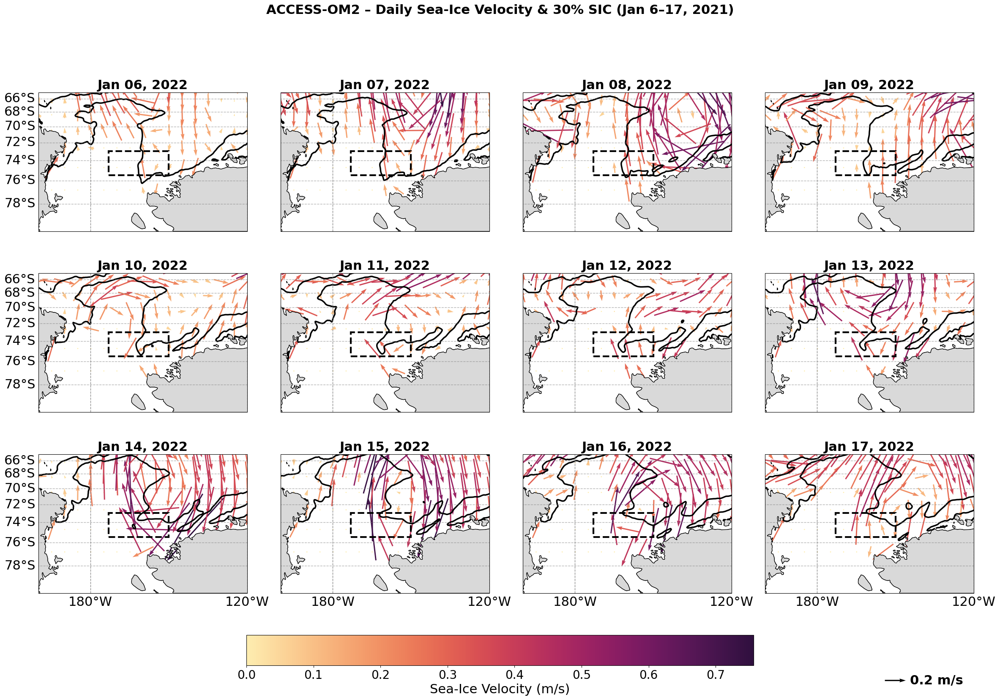

In [44]:
import numpy as np
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cft
import matplotlib.patches as mpatches
import cmocean.cm as cm
import pandas as pd
from cartopy.mpl.gridliner import LONGITUDE_FORMATTER, LATITUDE_FORMATTER

# -----------------------------
# Daily range
# -----------------------------
daily_dates = pd.date_range("2022-01-06", "2022-01-17", freq="D")
n_days = len(daily_dates)

# -----------------------------
# Subplot grid
# -----------------------------
ncols = 4
nrows = (n_days + ncols - 1) // ncols
fig, axes = plt.subplots(
    nrows=nrows, ncols=ncols,
    figsize=(ncols*6, nrows*6),
    subplot_kw={'projection': ccrs.Mercator(central_longitude=-160)}
)
axes = axes.flatten()

extent = [-200, -120, -80, -65]

# -----------------------------
# Loop over days
# -----------------------------
for i, date in enumerate(daily_dates):
    ax = axes[i]
    ax.set_extent(extent, crs=ccrs.PlateCarree())

    # Background land
    ax.add_feature(cft.NaturalEarthFeature("physical", "land", "50m",
                                           edgecolor="black", facecolor="0.85", linewidth=0.5))
    ax.coastlines(resolution="50m")

    # Daily data
    u_day = u.sel(time=date, method='nearest')
    v_day = v.sel(time=date, method='nearest')
    ice_day = ice.sel(time=date, method='nearest')

    # Compute velocity magnitude
    vel_mag = np.sqrt(u_day.values**2 + v_day.values**2)

    # Quiver grid
    skip = 20
    Lon, Lat = np.meshgrid(u.xt_ocean.values, u.yt_ocean.values)
    q = ax.quiver(
        Lon[::skip, ::skip], Lat[::skip, ::skip],
        u_day.values[::skip, ::skip], v_day.values[::skip, ::skip],
        vel_mag[::skip, ::skip],
        transform=ccrs.PlateCarree(),
        scale=2, width=0.006, cmap=cm.matter, pivot='middle'
    )

    # Sea-ice contour
    ice_day.plot.contour(
        ax=ax, transform=ccrs.PlateCarree(),
        levels=[0.2], colors='black', linewidths=2.5, add_colorbar=False
    )

    # Region box
    ax.add_patch(mpatches.Rectangle((-173, -75.5), 23, 2.5,
                                    linewidth=3, edgecolor='black', linestyle='--',
                                    facecolor='none', transform=ccrs.PlateCarree(), zorder=5))

    # Gridlines
    gl = ax.gridlines(draw_labels=True, linewidth=1, color='gray', alpha=0.6, linestyle='--')
    gl.top_labels = False
    gl.right_labels = False
    gl.xformatter = LONGITUDE_FORMATTER
    gl.yformatter = LATITUDE_FORMATTER
    gl.left_labels = i % ncols == 0
    gl.bottom_labels = i >= ncols*(nrows-1)
    gl.xlabel_style = {'size': 22}
    gl.ylabel_style = {'size': 22}

    # Title
    ax.set_title(date.strftime("%b %d, %Y"), fontsize=22, fontweight='bold')

# Hide unused subplots
for ax in axes[n_days:]:
    ax.set_visible(False)

# -----------------------------
# Shared horizontal colorbar
# -----------------------------
cbar_ax = fig.add_axes([0.25, 0.05, 0.5, 0.04])
cbar = fig.colorbar(q, cax=cbar_ax, orientation='horizontal')
cbar.set_label('Sea-Ice Velocity (m/s)', fontsize=22)
cbar.ax.tick_params(labelsize=20)

# -----------------------------
# Quiver reference vector on the last axis
# -----------------------------
axes[n_days-1].quiverkey(
    q, X=0.9, Y=0.03, U=0.2, label='0.2 m/s',
    labelpos='E', coordinates='figure', fontproperties={'size': 22, 'weight': 'bold'}
)

plt.suptitle("ACCESS-OM2 – Daily Sea-Ice Velocity & 30% SIC (Jan 6–17, 2021)",
             fontsize=22, fontweight='bold', y=0.92)  # moved lower
plt.tight_layout(rect=[0, 0.08, 1, 0.90])
plt.show()


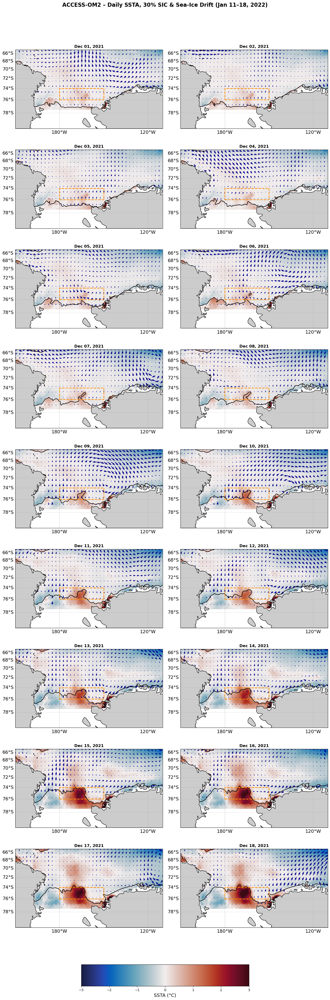

In [28]:
# Custom daily range
import pandas as pd
from cartopy.mpl.gridliner import LONGITUDE_FORMATTER, LATITUDE_FORMATTER
import matplotlib.patches as mpatches
%matplotlib inline

daily_dates = pd.date_range("2021-12-01", "2021-12-18", freq="D")
n_days = len(daily_dates)

# Subplot grid
ncols = 2
nrows = (n_days + 1) // 2
fig, axes = plt.subplots(
    nrows=nrows, ncols=ncols,
    figsize=(14, nrows * 5),
    subplot_kw={'projection': ccrs.Mercator(central_longitude=180)}
)
axes = axes.flatten()

extent = [-210, -110, -80, -65]

for i, date in enumerate(daily_dates):
    ax = axes[i]
    ax.set_extent(extent, crs=ccrs.PlateCarree())

    # Background
    land_50m = cft.NaturalEarthFeature("physical", "land", "50m",
                                       edgecolor="black", facecolor="0.8", linewidth=0.5)
    ax.add_feature(land_50m)
    ax.coastlines(resolution="50m")

    # Select that day
    ssta = SSTa.sel(time=date, method = 'nearest')
    ice_day = ice.sel(time=date, method = 'nearest')
    u_day = u.sel(time=date, method = 'nearest')
    v_day = v.sel(time=date, method = 'nearest')

    # SSTA
    ssta_plot = ssta.plot(
        x="lon", y="lat", ax=ax,
        transform=ccrs.PlateCarree(),
        vmin=-3, vmax=3,
        cmap=cm.cm.balance,
        extend="both",
        add_colorbar=False
    )

    # Sea-ice contour
    ice_day.plot.contour(
        ax=ax, transform=ccrs.PlateCarree(),
        levels=[0.2], colors='black', linewidths=1.5, add_colorbar=False
    )

    # Box around region of interest
    box = mpatches.Rectangle((-180, -76), 30, 2,
                                 linewidth=2, edgecolor='darkorange', linestyle='--',
                                 facecolor='none', transform=ccrs.PlateCarree(), zorder=5)
    ax.add_patch(box)

    # Sea-ice drift quiver
    skip = 10
    Lon, Lat = np.meshgrid(u.xt_ocean.values, u.yt_ocean.values)
    q = ax.quiver(
        Lon[::skip, ::skip],
        Lat[::skip, ::skip],
        u_day.values[::skip, ::skip],
        v_day.values[::skip, ::skip],
        transform=ccrs.PlateCarree(),
        scale_units='xy',
        scale=None,
        angles='xy',
        width=0.004,
        color='darkblue'
    )

    # Gridlines
    gl = ax.gridlines(draw_labels=True, linewidth=0.5,
                      color='gray', alpha=0.5, linestyle='--')
    gl.top_labels = False
    gl.right_labels = False
    gl.xformatter = LONGITUDE_FORMATTER
    gl.yformatter = LATITUDE_FORMATTER

    # Title
    ax.set_title(date.strftime("%b %d, %Y"), fontsize=12, fontweight="bold")

# Hide unused subplots
if len(axes) > n_days:
    for ax in axes[n_days:]:
        ax.set_visible(False)

# Shared colorbar
cbar_ax = fig.add_axes([0.25, 0.06, 0.5, 0.02])
cbar = fig.colorbar(ssta_plot, cax=cbar_ax, orientation='horizontal', label='SSTA (°C)')
cbar.ax.tick_params(labelsize=10)

plt.suptitle("ACCESS-OM2 – Daily SSTA, 30% SIC & Sea-Ice Drift (Jan 11–18, 2022)",
             fontsize=16, fontweight='bold', y=0.97)
plt.tight_layout(rect=[0, 0.1, 1, 0.95])
plt.show()



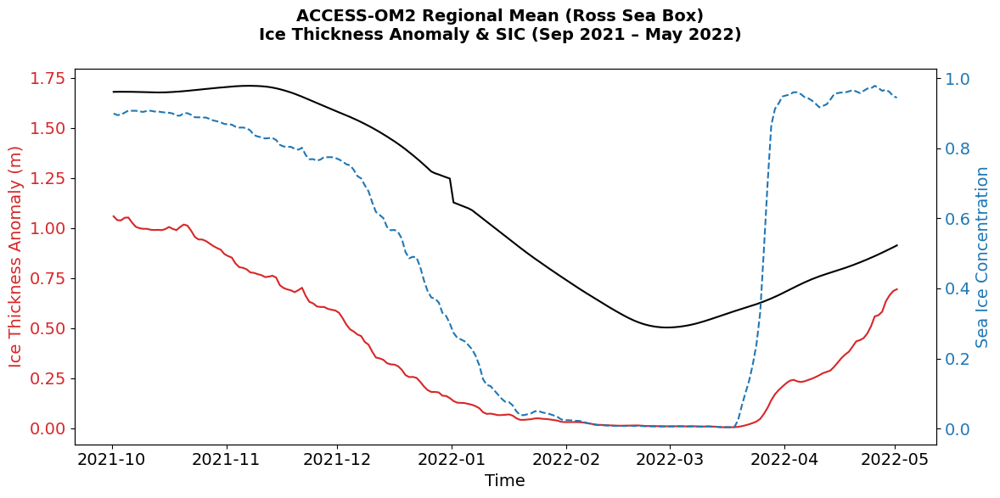

In [37]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
%matplotlib inline

# --- Define region of interest (same as box in your map code) ---
lon_min, lon_max = -170, -150   # 20° wide
lat_min, lat_max = -76, -73     # 3° tall

# --- Mask the region ---
roi_hi_clim = hi_clim_like_time.sel(xt_ocean=slice(lon_min, lon_max),
                           yt_ocean=slice(lat_min, lat_max)).sel(time = slice('2021-10-01','2022-05-01'))

# roi_sic = ice.sel(xt_ocean=slice(lon_min, lon_max),
#                   yt_ocean=slice(lat_min, lat_max)).sel(time = slice('2021-10-01','2022-05-01'))

roi_hi = hi.sel(xt_ocean=slice(lon_min, lon_max),
                           yt_ocean=slice(lat_min, lat_max)).sel(time = slice('2021-10-01','2022-05-01'))

roi_sic = ice.sel(xt_ocean=slice(lon_min, lon_max),
                  yt_ocean=slice(lat_min, lat_max)).sel(time = slice('2021-10-01','2022-05-01'))

# --- Compute time series (mean over box) ---
hi_series = roi_hi.mean(dim=['xt_ocean', 'yt_ocean'])
sic_series = roi_sic.mean(dim=['xt_ocean', 'yt_ocean'])
roi_hi_clim_series = roi_hi_clim.mean(dim=['xt_ocean', 'yt_ocean'])

# --- Plot ---
fig, ax1 = plt.subplots(figsize=(12,6))

color = 'tab:red'
ax1.set_xlabel('Time')
ax1.set_ylabel('Ice Thickness Anomaly (m)', color=color)
ax1.plot(hi_series['time'], hi_series, color=color, label='Ice Thickness Anomaly')
ax1.plot(roi_hi_clim_series['time'], roi_hi_clim_series['hi'], color='black', label='Ice Thickness Clim')
ax1.tick_params(axis='y', labelcolor=color)

ax2 = ax1.twinx()  # secondary y-axis for SIC
color = 'tab:blue'
ax2.set_ylabel('Sea Ice Concentration', color=color)
ax2.plot(sic_series['time'], sic_series, color=color, linestyle='--', label='SIC')
ax2.tick_params(axis='y', labelcolor=color)

# Title and legend
fig.suptitle("ACCESS-OM2 Regional Mean (Ross Sea Box)\nIce Thickness Anomaly & SIC (Sep 2021 – May 2022)", fontsize=14, fontweight='bold')

fig.tight_layout()
plt.show()


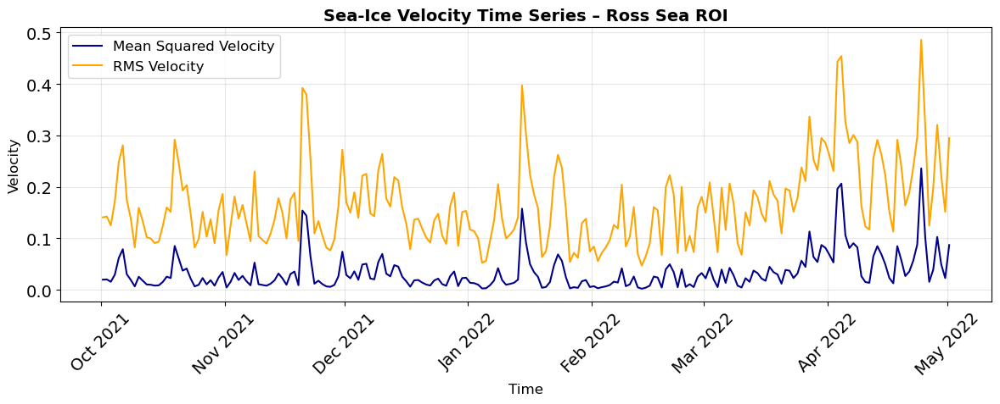

In [40]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import xarray as xr
import matplotlib.dates as mdates

# Define your region of interest (Ross Sea box)
lon_min, lon_max = -180, -150
lat_min, lat_max = -76, -72

# Select ROI from velocity data
# Adjust coordinates if u/v are staggered; here we assume T-grid alignment
u_roi = u.sel(xt_ocean=slice(lon_min, lon_max),
              yt_ocean=slice(lat_min, lat_max))
v_roi = v.sel(xt_ocean=slice(lon_min, lon_max),
              yt_ocean=slice(lat_min, lat_max))

# Compute squared velocity magnitude
vel_squared = u_roi**2 + v_roi**2

# Average over space to get one number per time step
vel_squared_mean = vel_squared.mean(dim=('yt_ocean', 'xt_ocean')).sel(time = slice('2021-10-01','2022-05-01'))

# Compute RMS velocity for intuitive units (m/s)
vel_rms = np.sqrt(vel_squared_mean)

# Create time series plot
plt.figure(figsize=(12,5))
plt.plot(vel_squared_mean['time'], vel_squared_mean, color='darkblue', label='Mean Squared Velocity')
plt.plot(vel_rms['time'], vel_rms, color='orange', label='RMS Velocity')
plt.xlabel('Time', fontsize=12)
plt.ylabel('Velocity', fontsize=12)
plt.title('Sea-Ice Velocity Time Series – Ross Sea ROI', fontsize=14, fontweight='bold')
plt.grid(alpha=0.3)

# Format x-axis as dates
plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%b %Y'))
plt.xticks(rotation=45)
plt.legend(fontsize=12)
plt.tight_layout()
plt.show()


2021-10-06 12:00:00 -> 0.2809113
2021-10-19 12:00:00 -> 0.29187515
2021-10-26 12:00:00 -> 0.15160021
2021-10-31 12:00:00 -> 0.18632565
2021-11-08 12:00:00 -> 0.23007815
2021-11-14 12:00:00 -> 0.17811944
2021-11-20 12:00:00 -> 0.3925262
2021-11-30 12:00:00 -> 0.27214164
2021-12-10 12:00:00 -> 0.2642128
2021-12-19 12:00:00 -> 0.13827218
2021-12-28 12:00:00 -> 0.18893564
2022-01-08 12:00:00 -> 0.20537797
2022-01-14 12:00:00 -> 0.39715663
2022-01-23 12:00:00 -> 0.26240188
2022-01-30 12:00:00 -> 0.13816477
2022-02-08 12:00:00 -> 0.20463692
2022-02-20 12:00:00 -> 0.22292092
2022-02-25 12:00:00 -> 0.104996614
2022-03-02 12:00:00 -> 0.20881048
2022-03-07 12:00:00 -> 0.20668425
2022-03-17 12:00:00 -> 0.21173029
2022-03-27 12:00:00 -> 0.33667004
2022-04-04 12:00:00 -> 0.45437923
2022-04-13 12:00:00 -> 0.29144084
2022-04-18 12:00:00 -> 0.29153594
2022-04-24 12:00:00 -> 0.48590273


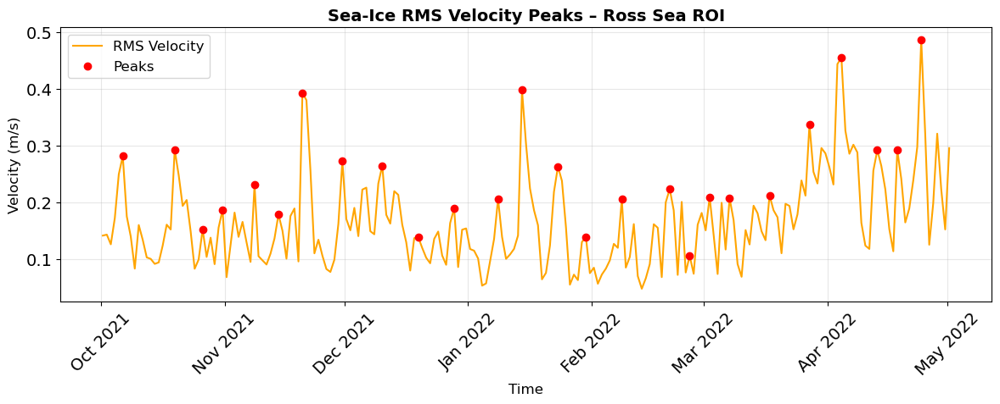

In [42]:
from scipy.signal import find_peaks

# Convert to numpy array for peak finding
rms_values = vel_rms.values

# Find peaks (you can tweak 'height' or 'distance' to filter)
peaks, properties = find_peaks(rms_values, height=None, distance=5)

# Extract times and values at peaks
peak_times = vel_rms['time'].values[peaks]
peak_values = rms_values[peaks]

# Print them
for t, v in zip(peak_times, peak_values):
    print(pd.to_datetime(t), "->", v)

# Plot with peaks marked
plt.figure(figsize=(12,5))
plt.plot(vel_rms['time'], vel_rms, color='orange', label='RMS Velocity')
plt.scatter(peak_times, peak_values, color='red', zorder=5, label='Peaks')

plt.xlabel('Time', fontsize=12)
plt.ylabel('Velocity (m/s)', fontsize=12)
plt.title('Sea-Ice RMS Velocity Peaks – Ross Sea ROI', fontsize=14, fontweight='bold')
plt.grid(alpha=0.3)

plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%b %Y'))
plt.xticks(rotation=45)
plt.legend(fontsize=12)
plt.tight_layout()
plt.show()


### Sea-Ice Velocity Movie

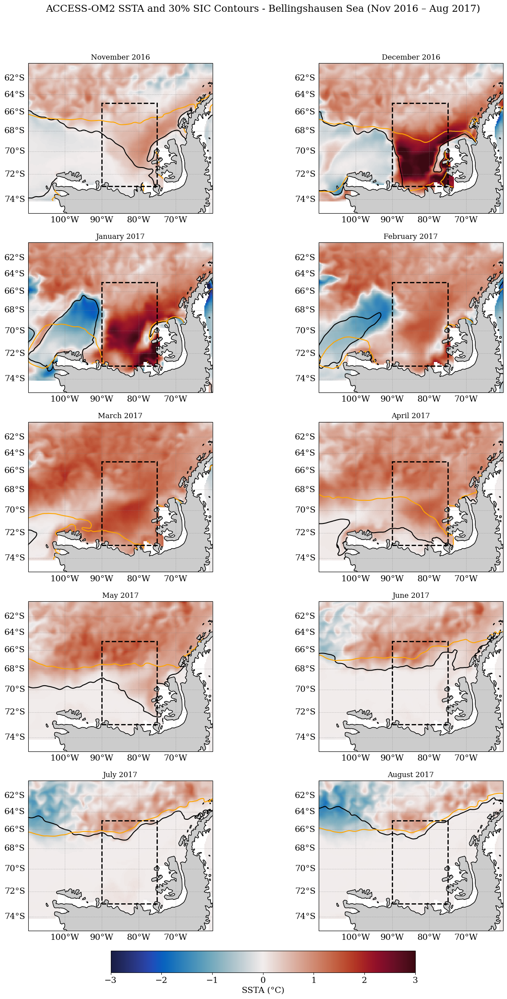

In [42]:
import numpy as np
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cft
import cmocean.cm as cm
import matplotlib.patches as mpatches
import pandas as pd
import calendar

%matplotlib inline

# Set global serif font
plt.rcParams['font.family'] = 'serif'

# Define months range
months = pd.date_range('2016-11-01', '2017-08-01', freq='MS')
n_months = len(months)

# Subplot grid setup: 2 columns, ceil(n/2) rows
ncols = 2
nrows = (n_months + 1) // 2
fig, axes = plt.subplots(nrows=nrows, ncols=ncols,
                         figsize=(14, nrows * 5),
                         subplot_kw={'projection': ccrs.Mercator()})
axes = axes.flatten()

# Define shared plotting parameters
extent = [-110, -60, -75, -60]
levels = [0.3]  # Sea ice concentration contour level

# Plot each month
for i, month_start in enumerate(months):
    month_end = month_start + pd.offsets.MonthEnd(1)
    time_slice = slice(str(month_start.date()), str(month_end.date()))
    month_name = calendar.month_name[month_start.month]
    year = month_start.year
    ax = axes[i]
    
    ax.set_extent(extent, crs=ccrs.PlateCarree())

    # Land and coastlines
    land_50m = cft.NaturalEarthFeature("physical", "land", "50m",
                                       edgecolor="black", facecolor="0.8", linewidth=0.5)
    ax.add_feature(land_50m)
    ax.coastlines(resolution="50m")

    # SSTa
    ssta = SSTa.sel(time=time_slice).mean('time')
    ssta_plot = ssta.plot(
        x="lon", y="lat", ax=ax,
        transform=ccrs.PlateCarree(),
        vmin=-3, vmax=3,
        cmap=cm.balance,
        extend="both",
        add_colorbar=False
    )

    # Sea ice and climatology contours
    ice_mean = ice.sel(time=time_slice).mean('time')
    clim_mean = clim.sel(time=time_slice).mean('time')

    ice_mean.plot.contour(
        ax=ax, transform=ccrs.PlateCarree(),
        levels=levels, colors='black',
        linewidths=1.5, add_colorbar=False
    )
    clim_mean.plot.contour(
        ax=ax, transform=ccrs.PlateCarree(),
        levels=levels, colors='orange',
        linewidths=1.5, add_colorbar=False
    )

    # Box around region of interest (customized to new extent)
    box = mpatches.Rectangle((-90, -73), 15, 8,
                             linewidth=2, edgecolor='black', linestyle='--',
                             facecolor='none', transform=ccrs.PlateCarree(), zorder=5)
    ax.add_patch(box)

    # Gridlines
    gl = ax.gridlines(draw_labels=True, linewidth=0.5,
                  color='gray', alpha=0.5, linestyle='--')
    gl.top_labels = False
    gl.right_labels = False

    # Title
    ax.set_title(f"{month_name} {year}", fontsize=12, fontweight='normal')

# Hide any extra subplot
if len(axes) > n_months:
    for ax in axes[n_months:]:
        ax.set_visible(False)

# Shared colorbar
cbar_ax = fig.add_axes([0.25, 0.08, 0.5, 0.02])
fig.colorbar(ssta_plot, cax=cbar_ax, orientation='horizontal', label='SSTA (°C)')

# Super title
plt.suptitle("ACCESS-OM2 SSTA and 30% SIC Contours - Bellingshausen Sea (Nov 2016 – Aug 2017)",
             fontsize=16, y=0.97)

plt.tight_layout(rect=[0, 0.1, 1, 0.95])
plt.show()


In [21]:
def plot_sea_ice_edge_comparison(SSTa, fig, frame, framedim, *, ice, clim):
    ax = fig.add_subplot(1, 1, 1, projection=ccrs.SouthPolarStereo())
    ax.set_extent([-280, 80, -80, -50], crs=ccrs.PlateCarree())

    # Add map features
    land_50m = cft.NaturalEarthFeature("physical", "land", "50m",
                                       edgecolor="black", facecolor="papayawhip", linewidth=0.5)
    ax.add_feature(land_50m, color=[0.8, 0.8, 0.8])
    ax.coastlines(resolution="50m")

    # Circular boundary
    theta = np.linspace(0, 2 * np.pi, 100)
    center, radius = [0.5, 0.5], 0.5
    verts = np.vstack([np.sin(theta), np.cos(theta)]).T
    circle = mpath.Path(verts * radius + center)
    ax.set_boundary(circle, transform=ax.transAxes)

    # Plot SSTa frame
    SSTa.isel(time=frame).plot(
        ax=ax,
        x="lon",
        y="lat",
        transform=ccrs.PlateCarree(),
        vmin=-3,
        vmax=3,
        cmap=cm.balance,
        extend="both",
        cbar_kwargs={"label": "SSTA (°C)", "fraction": 0.03, "aspect": 15, "shrink": 0.7}
    )

    # Contour overlays
    ice.isel(time=frame).plot.contour(
        ax=ax,
        transform=ccrs.PlateCarree(),
        levels=[0.4],
        colors=['black'],
        linewidths=2,
        add_colorbar=False
    )

    clim.isel(time=frame).plot.contour(
        ax=ax,
        transform=ccrs.PlateCarree(),
        levels=[0.4],
        colors=['orange'],
        linewidths=2,
        add_colorbar=False
    )

    ax.set_title(f"SSTa Over Time\n{str(SSTa.time.values[frame])[:10]}")
    return ax,

In [24]:
SSTa_subset = SSTa.sel(time=slice("2022-12-20", "2023-12-31"))
ice_subset = ice.sel(time=slice("2022-12-20", "2023-12-31"))
clim_subset = clim.sel(time=slice("2022-12-20", "2023-12-31"))

In [25]:
import os
movie_dir = "/g/data/e14/ts7341/Analysis_Using_Daily_JRA/MHW_Movie_2016-2023"

mov = Movie(
    SSTa_subset,
    plot_sea_ice_edge_comparison,
    framedim="time",  # or whatever dimension you're animating over
    ice=ice_subset,
    clim=clim_subset,
    input_check=False,
)


mov.path = movie_dir

In [26]:
mov.save("/g/data/e14/ts7341/Analysis_Using_Daily_JRA/MHW_Movie_2016-2023/SSTa_2022_23.mp4", progress=True)

  0%|          | 0/375 [00:00<?, ?it/s]

Movie created at SSTa_2022_23.mp4


In [19]:
import cv2
import os

# Folder with PNGs
folder = '/g/data/e14/ts7341/Analysis_Using_Daily_JRA/MHW_Movie_2016-2023'  # <-- change this
output = os.path.join(folder, 'sea_ice_97_98.mp4')  # Save MP4 in the same folder
fps = 10

files = sorted([f for f in os.listdir(folder) if f.endswith('.png')])

frame = cv2.imread(os.path.join(folder, files[0]))
h, w, _ = frame.shape

# Create video writer
out = cv2.VideoWriter(output, cv2.VideoWriter_fourcc(*'mp4v'), fps, (w, h))

# Write all frames
for file in files:
    img = cv2.imread(os.path.join(folder, file))
    out.write(img)

out.release()
print(f'Saved as {output}')


Saved as /g/data/e14/ts7341/Analysis_Using_Daily_JRA/MHW_Movie_2016-2023/sea_ice_97_98.mp4


## MHW – Monthly Ice Variables

In [20]:
clim = xr.open_dataset('/g/data/e14/ts7341/Analysis_Using_Daily_JRA/ice_climatologies/monthly/ice_clim_years.nc')
ds = xr.open_dataset('/g/data/e14/ts7341/Analysis_Using_Daily_JRA/ice_climatologies/monthly/ice_analysis_years.nc')

In [21]:
clim.load()
ds.load()

<xarray.Dataset> Size: 907MB
Dimensions:        (time: 96, yt_ocean: 233, xt_ocean: 1440)
Coordinates:
  * time           (time) datetime64[ns] 768B 2016-01-31 ... 2023-12-31
    TLON           (yt_ocean, xt_ocean) float32 1MB nan nan nan ... 79.62 79.88
    TLAT           (yt_ocean, xt_ocean) float32 1MB nan nan ... -55.14 -55.14
    ULON           (yt_ocean, xt_ocean) float32 1MB nan nan nan ... 79.5 79.75
    ULAT           (yt_ocean, xt_ocean) float32 1MB nan nan ... -55.07 -55.07
  * xt_ocean       (xt_ocean) float64 12kB -279.9 -279.6 -279.4 ... 79.62 79.88
  * yt_ocean       (yt_ocean) float64 2kB -81.08 -80.97 -80.87 ... -55.28 -55.14
Data variables:
    hi_m           (time, yt_ocean, xt_ocean) float32 129MB nan ... 1.321e-06
    ice_present_m  (time, yt_ocean, xt_ocean) float32 129MB nan nan ... 1.0 1.0
    fswthru_ai_m   (time, yt_ocean, xt_ocean) float32 129MB nan ... 4.945e-06
    fhocn_ai_m     (time, yt_ocean, xt_ocean) float32 129MB nan ... -4.948e-05
    Tair_m         (time, yt_ocean, xt_ocean) float32 129MB nan nan ... 1.39
    congel_m       (time, yt_ocean, xt_ocean) float32 129MB nan nan ... 0.0 0.0
    frazil_m       (time, yt_ocean, xt_ocean) float32 129MB nan nan ... 0.0 0.0
Attributes:
    title:        sea ice model output for CICE
    contents:     Diagnostic and Prognostic Variables
    source:       Los Alamos Sea Ice Model (CICE) Version 5
    comment:      This Year Has 366 days
    comment2:     File written on model date 20160201
    comment3:     seconds elapsed into model date:      0
    conventions:  CF-1.0
    history:      This dataset was created on 2024-12-21 at 01:37:57.2
    io_flavor:    io_netcdf

In [22]:
def calculate_temp_anomaly(data, apply_rolling=False, rolling_window=3):
    """
    Calculates monthly temperature anomalies based on a 30-year climatology.
    Optionally applies a rolling mean smoothing to the climatology.
    
    Parameters:
        data (xarray.DataArray): Input temperature data with dimensions (time, st_ocean, lat, lon)
        apply_rolling (bool): Whether to apply rolling mean to the climatology
        rolling_window (int): Window size for rolling mean (applied along month dimension)

    Returns:
        climatology (xarray.DataArray): Monthly climatology (optionally smoothed)
        anomalies (xarray.DataArray): Monthly temperature anomalies
    """
    # 1. Select baseline period
    baseline_period = data.sel(time=slice("1982-01-01", "2011-12-31"))

    # 2. Compute monthly climatology (preserving st_ocean, lat, lon)
    clim_data = baseline_period.groupby("time.month").mean("time", keep_attrs=True)

    # 3. Optional rolling smoothing over the 12-month climatology
    if apply_rolling:
        clim_data = clim_data.rolling(month=rolling_window, center=True, min_periods=1).mean()

    return clim_data

clim_data = calculate_temp_anomaly(clim)
anomalies = ds.groupby("time.month") - clim_data

In [23]:
anomalies

<xarray.Dataset> Size: 907MB
Dimensions:        (time: 96, yt_ocean: 233, xt_ocean: 1440)
Coordinates:
  * time           (time) datetime64[ns] 768B 2016-01-31 ... 2023-12-31
    TLON           (yt_ocean, xt_ocean) float32 1MB nan nan nan ... 79.62 79.88
    TLAT           (yt_ocean, xt_ocean) float32 1MB nan nan ... -55.14 -55.14
    ULON           (yt_ocean, xt_ocean) float32 1MB nan nan nan ... 79.5 79.75
    ULAT           (yt_ocean, xt_ocean) float32 1MB nan nan ... -55.07 -55.07
  * xt_ocean       (xt_ocean) float64 12kB -279.9 -279.6 -279.4 ... 79.62 79.88
  * yt_ocean       (yt_ocean) float64 2kB -81.08 -80.97 -80.87 ... -55.28 -55.14
    month          (time) int64 768B 1 2 3 4 5 6 7 8 9 ... 4 5 6 7 8 9 10 11 12
Data variables:
    hi_m           (time, yt_ocean, xt_ocean) float32 129MB nan ... -0.002332
    ice_present_m  (time, yt_ocean, xt_ocean) float32 129MB nan nan ... 0.1892
    fswthru_ai_m   (time, yt_ocean, xt_ocean) float32 129MB nan ... -0.003099
    fhocn_ai_m     (time, yt_ocean, xt_ocean) float32 129MB nan nan ... 0.6605
    Tair_m         (time, yt_ocean, xt_ocean) float32 129MB nan nan ... 0.1314
    congel_m       (time, yt_ocean, xt_ocean) float32 129MB nan nan ... 0.0 0.0
    frazil_m       (time, yt_ocean, xt_ocean) float32 129MB nan nan ... 0.0 0.0

In [24]:
#hi_m – thickness of ice in m

In [31]:
hi_m_anom = anomalies.hi_m
congel_anom = anomalies.congel_m
frazil_anom = anomalies.frazil_m
ice_growth_anom = congel_anom + frazil_anom
fswthru_ai_m_anom = anomalies.fswthru_ai_m

hi_m_usual = ds.hi_m
congel_usual = ds.congel_m
frazil_usual = ds.frazil_m
ice_growth_usual = congel_usual + frazil_usual
fswthru_ai_m_usual = ds.fswthru_ai_m

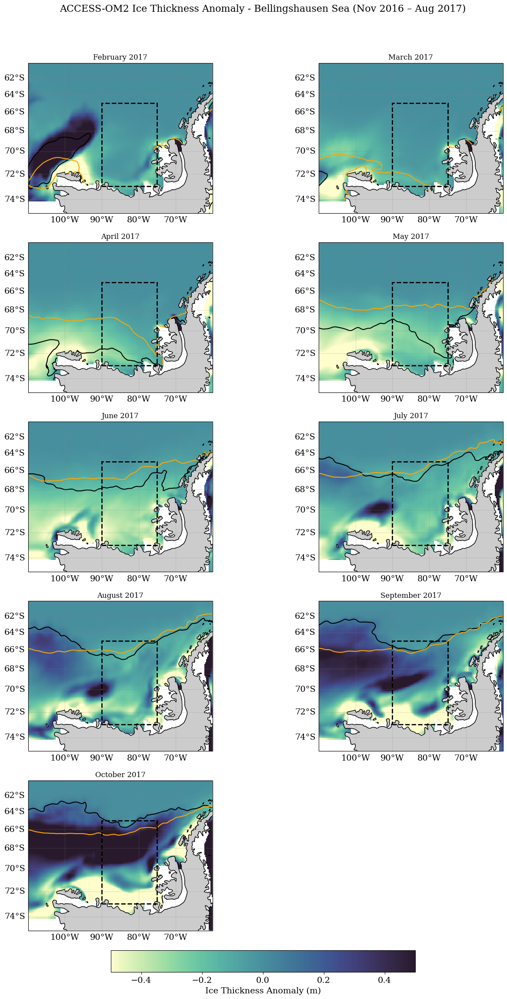

In [34]:
import numpy as np
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cft
import cmocean.cm as cm
import matplotlib.patches as mpatches
import pandas as pd
import calendar

%matplotlib inline

# Set global serif font
plt.rcParams['font.family'] = 'serif'

# Define months range
months = pd.date_range('2017-02-01', '2017-10-01', freq='MS')
n_months = len(months)

# Subplot grid setup: 2 columns, ceil(n/2) rows
ncols = 2
nrows = (n_months + 1) // 2
fig, axes = plt.subplots(nrows=nrows, ncols=ncols,
                         figsize=(14, nrows * 5),
                         subplot_kw={'projection': ccrs.Mercator()})

axes = axes.flatten()
levels = [0.3]

# # Define shared plotting parameters
#Weddell Box
# extent = [-50, 40, -80, -55]
# levels = [0.3]

# Define shared plotting parameters – Bellingshausen
extent = [-110, -60, -75, -60]
levels = [0.3]  # Sea ice concentration contour level

# Plot each month
for i, month_start in enumerate(months):
    month_end = month_start + pd.offsets.MonthEnd(1)
    time_slice = slice(str(month_start.date()), str(month_end.date()))
    month_name = calendar.month_name[month_start.month]
    year = month_start.year
    ax = axes[i]
    
    ax.set_extent(extent, crs=ccrs.PlateCarree())

    # Land and coastlines
    land_50m = cft.NaturalEarthFeature("physical", "land", "50m",
                                       edgecolor="black", facecolor="0.8", linewidth=0.5)
    ax.add_feature(land_50m)
    ax.coastlines(resolution="50m")

    # SSTa
    ssta = hi_m_anom.sel(time=time_slice)
    ssta_plot = ssta.plot(
        x="xt_ocean", y="yt_ocean", ax=ax,
        transform=ccrs.PlateCarree(),
        vmin=-.5, vmax=.5,
        cmap=cm.deep,
        extend="both",
        add_colorbar=False
    )
    
    ice_mean = ice.sel(time=time_slice).mean('time')
    clim_mean = ice_clim.sel(time=time_slice).mean('time')
    
    ice_mean.plot.contour(
        ax=ax, transform=ccrs.PlateCarree(),
        levels=levels, colors='black',
        linewidths=1.5, add_colorbar=False
    )
    clim_mean.plot.contour(
        ax=ax, transform=ccrs.PlateCarree(),
        levels=levels, colors='orange',
        linewidths=1.5, add_colorbar=False
    )

    # Box around region of interest (customized to new extent)
    ## Weddell Box
    # box = mpatches.Rectangle((-15, -68), 25, 5,
    #                          linewidth=2, edgecolor='black', linestyle='--',
    #                          facecolor='none', transform=ccrs.PlateCarree(), zorder=5)
    # ax.add_patch(box)

    box = mpatches.Rectangle((-90, -73), 15, 8,
                             linewidth=2, edgecolor='black', linestyle='--',
                             facecolor='none', transform=ccrs.PlateCarree(), zorder=5)
    ax.add_patch(box)

    # Gridlines
    gl = ax.gridlines(draw_labels=True, linewidth=0.5,
                  color='gray', alpha=0.5, linestyle='--')
    gl.top_labels = False
    gl.right_labels = False

    # Title
    ax.set_title(f"{month_name} {year}", fontsize=12, fontweight='normal')

# Hide any extra subplot
if len(axes) > n_months:
    for ax in axes[n_months:]:
        ax.set_visible(False)

# Shared colorbar
cbar_ax = fig.add_axes([0.25, 0.08, 0.5, 0.02])
fig.colorbar(ssta_plot, cax=cbar_ax, orientation='horizontal', label='Ice Thickness Anomaly (m)')

# Super title
plt.suptitle("ACCESS-OM2 Ice Thickness Anomaly - Bellingshausen Sea (Nov 2016 – Aug 2017)",
             fontsize=16, y=0.97)

plt.tight_layout(rect=[0, 0.1, 1, 0.95])
plt.show()

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cft
import cmocean.cm as cm
import matplotlib.patches as mpatches
import pandas as pd
import calendar

%matplotlib inline

# Set global serif font
plt.rcParams['font.family'] = 'serif'

# Define months range
months = pd.date_range('2016-11-01', '2017-08-01', freq='MS')
n_months = len(months)

# Subplot grid setup: 2 columns, ceil(n/2) rows
ncols = 2
nrows = (n_months + 1) // 2
fig, axes = plt.subplots(nrows=nrows, ncols=ncols,
                         figsize=(14, nrows * 5),
                         subplot_kw={'projection': ccrs.Mercator()})

axes = axes.flatten()
levels = [0.3]

# Define shared plotting parameters - Weddell
# extent = [-50, 40, -80, -55]
# levels = [0.3]

# Define shared plotting parameters – Bellingshausen
extent = [-110, -60, -75, -60]
levels = [0.3]  # Sea ice concentration contour level

# Plot each month
for i, month_start in enumerate(months):
    month_end = month_start + pd.offsets.MonthEnd(1)
    time_slice = slice(str(month_start.date()), str(month_end.date()))
    month_name = calendar.month_name[month_start.month]
    year = month_start.year
    ax = axes[i]
    
    ax.set_extent(extent, crs=ccrs.PlateCarree())

    # Land and coastlines
    land_50m = cft.NaturalEarthFeature("physical", "land", "50m",
                                       edgecolor="black", facecolor="0.8", linewidth=0.5)
    ax.add_feature(land_50m)
    ax.coastlines(resolution="50m")

    # SSTa
    ssta = fswthru_ai_m_anom.sel(time=time_slice)
    ssta_plot = ssta.plot(
        x="xt_ocean", y="yt_ocean", ax=ax,
        transform=ccrs.PlateCarree(),
        vmin=-20, vmax=20,
        cmap=cm.deep,
        extend="both",
        add_colorbar=False
    )
    
    ice_mean = ice.sel(time=time_slice).mean('time')
    clim_mean = ice_clim.sel(time=time_slice).mean('time')
    
    ice_mean.plot.contour(
        ax=ax, transform=ccrs.PlateCarree(),
        levels=levels, colors='black',
        linewidths=1.5, add_colorbar=False
    )
    clim_mean.plot.contour(
        ax=ax, transform=ccrs.PlateCarree(),
        levels=levels, colors='orange',
        linewidths=1.5, add_colorbar=False
    )

    # Box around region of interest (customized to new extent)
    #Weddell Box
    # box = mpatches.Rectangle((-15, -68), 25, 5,
    #                          linewidth=2, edgecolor='black', linestyle='--',
    #                          facecolor='none', transform=ccrs.PlateCarree(), zorder=5)
    # ax.add_patch(box)

    box = mpatches.Rectangle((-90, -73), 15, 8,
                             linewidth=2, edgecolor='black', linestyle='--',
                             facecolor='none', transform=ccrs.PlateCarree(), zorder=5)
    ax.add_patch(box)

    # Gridlines
    gl = ax.gridlines(draw_labels=True, linewidth=0.5,
                  color='gray', alpha=0.5, linestyle='--')
    gl.top_labels = False
    gl.right_labels = False

    # Title
    ax.set_title(f"{month_name} {year}", fontsize=12, fontweight='normal')

# Hide any extra subplot
if len(axes) > n_months:
    for ax in axes[n_months:]:
        ax.set_visible(False)

# Shared colorbar
cbar_ax = fig.add_axes([0.25, 0.08, 0.5, 0.02])
fig.colorbar(ssta_plot, cax=cbar_ax, orientation='horizontal', label='Ice Thickness (m)')

# Super title
plt.suptitle("ACCESS-OM2 Shortwave Flux through Ice Anomaly - Bellingshausen Sea (Nov 2016 – Aug 2017)",
             fontsize=16, y=0.97)

plt.tight_layout(rect=[0, 0.1, 1, 0.95])
plt.show()

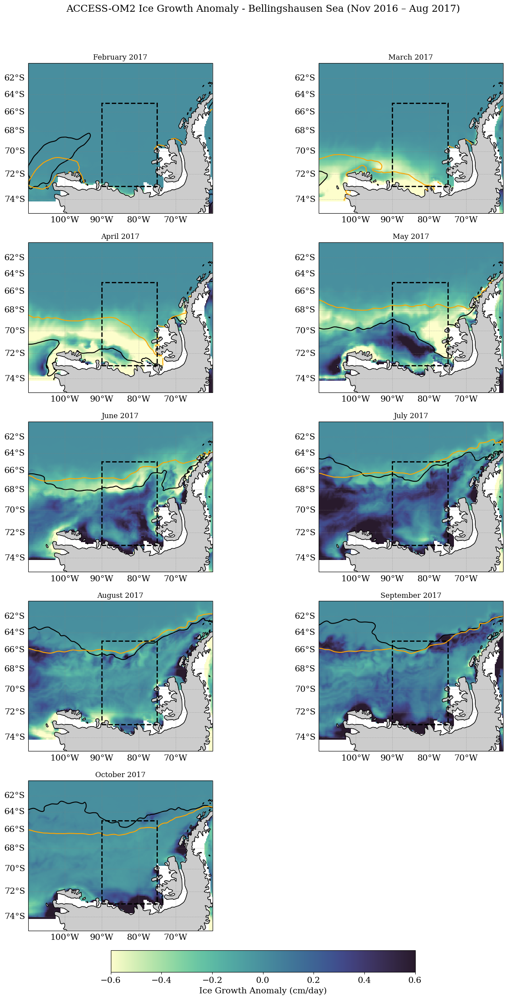

In [36]:
import numpy as np
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cft
import cmocean.cm as cm
import matplotlib.patches as mpatches
import pandas as pd
import calendar

%matplotlib inline

# Set global serif font
plt.rcParams['font.family'] = 'serif'

# Define months range
months = pd.date_range('2017-02-01', '2017-10-01', freq='MS')
n_months = len(months)

# Subplot grid setup: 2 columns, ceil(n/2) rows
ncols = 2
nrows = (n_months + 1) // 2
fig, axes = plt.subplots(nrows=nrows, ncols=ncols,
                         figsize=(14, nrows * 5),
                         subplot_kw={'projection': ccrs.Mercator()})
axes = axes.flatten()

# # Define shared plotting parameters
#Wedell Event
# extent = [-50, 40, -80, -55]
# levels = [0.3]

# Define shared plotting parameters – Bellingshausen
extent = [-110, -60, -75, -60]
levels = [0.3]  # Sea ice concentration contour level


# Plot each month
for i, month_start in enumerate(months):
    month_end = month_start + pd.offsets.MonthEnd(1)
    time_slice = slice(str(month_start.date()), str(month_end.date()))
    month_name = calendar.month_name[month_start.month]
    year = month_start.year
    ax = axes[i]
    
    ax.set_extent(extent, crs=ccrs.PlateCarree())

    # Land and coastlines
    land_50m = cft.NaturalEarthFeature("physical", "land", "50m",
                                       edgecolor="black", facecolor="0.8", linewidth=0.5)
    ax.add_feature(land_50m)
    ax.coastlines(resolution="50m")

    # SSTa
    ssta = ice_growth_anom.sel(time=time_slice)
    ssta_plot = ssta.plot(
        x="xt_ocean", y="yt_ocean", ax=ax,
        transform=ccrs.PlateCarree(),
        vmin=-.6, vmax=.6,
        cmap=cm.deep,
        extend="both",
        add_colorbar=False
    )

    ice_mean = ice.sel(time=time_slice).mean('time')
    clim_mean = ice_clim.sel(time=time_slice).mean('time')
    
    ice_mean.plot.contour(
        ax=ax, transform=ccrs.PlateCarree(),
        levels=levels, colors='black',
        linewidths=1.5, add_colorbar=False
    )
    clim_mean.plot.contour(
        ax=ax, transform=ccrs.PlateCarree(),
        levels=levels, colors='orange',
        linewidths=1.5, add_colorbar=False
    )

    # Box around region of interest (customized to new extent)
    # Weddell Box
    # box = mpatches.Rectangle((-15, -68), 25, 5,
    #                          linewidth=2, edgecolor='black', linestyle='--',
    #                          facecolor='none', transform=ccrs.PlateCarree(), zorder=5)
    # ax.add_patch(box)

    box = mpatches.Rectangle((-90, -73), 15, 8,
                             linewidth=2, edgecolor='black', linestyle='--',
                             facecolor='none', transform=ccrs.PlateCarree(), zorder=5)
    ax.add_patch(box)

    # Gridlines
    gl = ax.gridlines(draw_labels=True, linewidth=0.5,
                  color='gray', alpha=0.5, linestyle='--')
    gl.top_labels = False
    gl.right_labels = False

    # Title
    ax.set_title(f"{month_name} {year}", fontsize=12, fontweight='normal')

# Hide any extra subplot
if len(axes) > n_months:
    for ax in axes[n_months:]:
        ax.set_visible(False)

# Shared colorbar
cbar_ax = fig.add_axes([0.25, 0.08, 0.5, 0.02])
fig.colorbar(ssta_plot, cax=cbar_ax, orientation='horizontal', label='Ice Growth Anomaly (cm/day)')

# Super title
plt.suptitle("ACCESS-OM2 Ice Growth Anomaly - Bellingshausen Sea (Nov 2016 – Aug 2017)",
             fontsize=16, y=0.97)

plt.tight_layout(rect=[0, 0.1, 1, 0.95])
plt.show()

## Basic Relations

In [85]:
SSTa

<xarray.DataArray 'sst' (time: 2920, lat: 266, lon: 1440)> Size: 9GB
array([[[        nan,         nan,         nan, ...,         nan,
                 nan,         nan],
        [        nan,         nan,         nan, ...,         nan,
                 nan,         nan],
        [        nan,         nan,         nan, ...,         nan,
                 nan,         nan],
        ...,
        [-1.20788956, -1.15266752, -1.17530346, ..., -1.39849997,
         -1.19449806, -1.34068131],
        [-1.1142931 , -1.34495568, -1.35269785, ..., -0.89107561,
         -0.8066287 , -0.8719821 ],
        [-0.45321369, -0.95958233, -1.44866085, ..., -0.33997536,
         -0.19909668, -0.23811913]],

       [[        nan,         nan,         nan, ...,         nan,
                 nan,         nan],
        [        nan,         nan,         nan, ...,         nan,
                 nan,         nan],
        [        nan,         nan,         nan, ...,         nan,
                 nan,         nan],
...
        [ 0.9986403 ,  1.57734323,  1.85778642, ..., -0.40535069,
         -0.0483079 ,  0.37705851],
        [ 0.07486057,  0.45623088,  0.96726847, ..., -1.00640059,
         -0.62097311, -0.32948542],
        [-0.51316547, -0.37244081, -0.18320322, ..., -1.64499569,
         -1.21974087, -0.79475927]],

       [[        nan,         nan,         nan, ...,         nan,
                 nan,         nan],
        [        nan,         nan,         nan, ...,         nan,
                 nan,         nan],
        [        nan,         nan,         nan, ...,         nan,
                 nan,         nan],
        ...,
        [ 1.29785037,  1.77697444,  1.89703846, ..., -0.38350105,
          0.0372858 ,  0.61943746],
        [ 0.19733238,  0.60165548,  1.10475564, ..., -0.93745613,
         -0.59199142, -0.21277189],
        [-0.4793005 , -0.29695225, -0.09773779, ..., -1.6014843 ,
         -1.1545372 , -0.72213364]]])
Coordinates:
  * lat        (lat) float64 2kB -81.08 -80.97 -80.87 ... -50.46 -50.3 -50.14
  * lon        (lon) float64 12kB -279.9 -279.6 -279.4 ... 79.38 79.62 79.88
    dayofyear  (time) int64 23kB 1 2 3 4 5 6 7 8 ... 357 358 359 360 361 362 363
  * time       (time) datetime64[ns] 23kB 2016-01-01T12:00:00 ... 2023-12-29T...

In [121]:
SSTa = SSTa.sel(lat = slice(-90,-55))

Points before outlier removal: 9545, after IQR clipping: 9292


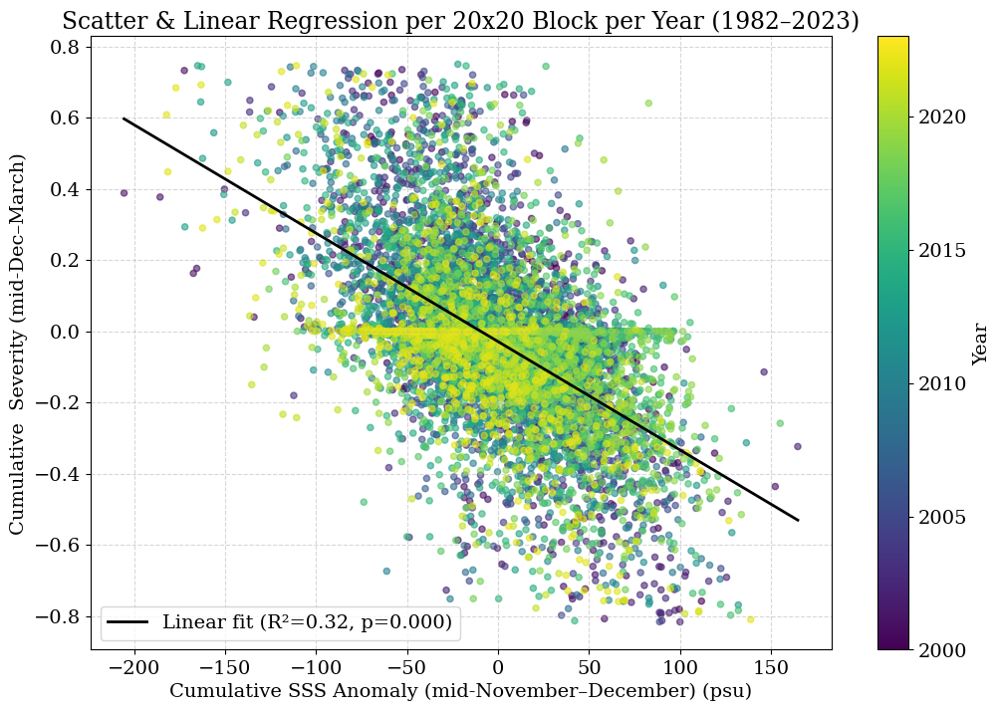

Linear Regression Results (After IQR outlier removal):
Slope: -0.0030
Intercept: -0.0291
R²: 0.3201
p-value: 0.0000e+00
Spearman rho: -0.5542, p-value: 0.0000e+00


In [130]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import linregress, spearmanr
import matplotlib.cm as cm
import matplotlib.colors as mcolors

# -----------------------------
# Parameters
# -----------------------------
block_size_lat = 20
block_size_lon = 20
years = np.arange(2000, 2024)

# -----------------------------
# Area-weighted block averaging function
# -----------------------------
def block_average_area_weighted(arr, lats, block_size_lat, block_size_lon):
    n_lat, n_lon = arr.shape
    n_lat_trunc = (n_lat // block_size_lat) * block_size_lat
    n_lon_trunc = (n_lon // block_size_lon) * block_size_lon
    arr = arr[:n_lat_trunc, :n_lon_trunc]
    lats_trunc = lats[:n_lat_trunc]

    # Area weights
    weights = np.cos(np.deg2rad(lats_trunc))
    weights = np.repeat(weights[:, np.newaxis], n_lon_trunc, axis=1)

    # Reshape for block averaging
    arr_block = arr.reshape(n_lat_trunc//block_size_lat, block_size_lat,
                            n_lon_trunc//block_size_lon, block_size_lon)
    weights_block = weights.reshape(n_lat_trunc//block_size_lat, block_size_lat,
                                    n_lon_trunc//block_size_lon, block_size_lon)

    # Weighted mean per block
    weighted_sum = (arr_block * weights_block).sum(axis=(1,3))
    total_weights = weights_block.sum(axis=(1,3))
    return weighted_sum / total_weights

# -----------------------------
# Collect block-averaged values
# -----------------------------
x_list, y_list, year_list = [], [], []

lats = SSTa['lat'].values  # Assuming your dataset has latitudes

for yr in years:
    if yr == 2023:
        continue
    
    sic = SSTa.sel(time=slice(f"{yr+1}-01-01", f"{yr+1}-02-28")).sum(dim="time").values
    severity = hi_anom['hi'].sel(time=slice(f"{yr}-11-01", f"{yr}-12-31")).mean(dim="time").values

    severity_block = block_average_area_weighted(severity, lats, block_size_lat, block_size_lon)
    sic_block = block_average_area_weighted(sic, lats, block_size_lat, block_size_lon)

    # Flatten and append
    x_list.append(sic_block.flatten())       # Predictor
    y_list.append(severity_block.flatten())  # Response
    year_list.append(np.full(sic_block.size, yr))

# Stack all years
x = np.concatenate(x_list)  # SIC anomaly
y = np.concatenate(y_list)  # Severity
years_flat = np.concatenate(year_list)

# Remove NaNs
mask = (~np.isnan(x)) & (~np.isnan(y))
x, y, years_flat = x[mask], y[mask], years_flat[mask]

if len(x) == 0 or len(y) == 0:
    raise ValueError("No valid data points left after masking NaNs. Check your input arrays.")

# -----------------------------
# Outlier removal using IQR (robust)
# -----------------------------
q25_x, q75_x = np.percentile(x, [25, 75])
iqr_x = q75_x - q25_x
q25_y, q75_y = np.percentile(y, [25, 75])
iqr_y = q75_y - q25_y
thresh = 3

mask_iqr = ((x >= q25_x - thresh*iqr_x) & (x <= q75_x + thresh*iqr_x) &
            (y >= q25_y - thresh*iqr_y) & (y <= q75_y + thresh*iqr_y))

x_clean = x[mask_iqr]
y_clean = y[mask_iqr]
years_clean = years_flat[mask_iqr]

print(f"Points before outlier removal: {len(x)}, after IQR clipping: {len(x_clean)}")

# -----------------------------
# Linear regression + Spearman correlation
# -----------------------------
slope, intercept, r_value, p_value, std_err = linregress(x_clean, y_clean)
rho, rho_p = spearmanr(x_clean, y_clean)

x_fit = np.linspace(x_clean.min(), x_clean.max(), 200)
y_fit = slope * x_fit + intercept

# -----------------------------
# Scatter plot colored by year
# -----------------------------
norm = mcolors.Normalize(vmin=years[0], vmax=years[-1])
cmap = cm.viridis
colors = cmap(norm(years_clean))

fig, ax = plt.subplots(figsize=(12,8))
sc = ax.scatter(x_clean, y_clean, alpha=0.6, s=20, color=colors)  # SIC on x, severity on y
ax.plot(x_fit, y_fit, color="black", lw=2,
        label=f"Linear fit (R²={r_value**2:.2f}, p={p_value:.3f})")
ax.set_xlabel("Cumulative SSS Anomaly (mid-November–December) (psu)")
ax.set_ylabel("Cumulative  Severity (mid-Dec–March)")
ax.set_title(f"Scatter & Linear Regression per {block_size_lat}x{block_size_lon} Block per Year (1982–2023)")
ax.grid(ls="--", alpha=0.5)
ax.legend()

# Colorbar
sm = cm.ScalarMappable(cmap=cmap, norm=norm)
sm.set_array([])
cbar = fig.colorbar(sm, ax=ax)
cbar.set_label('Year')

plt.show()

# -----------------------------
# Print regression results
# -----------------------------
print("Linear Regression Results (After IQR outlier removal):")
print(f"Slope: {slope:.4f}")
print(f"Intercept: {intercept:.4f}")
print(f"R²: {r_value**2:.4f}")
print(f"p-value: {p_value:.4e}")
print(f"Spearman rho: {rho:.4f}, p-value: {rho_p:.4e}")

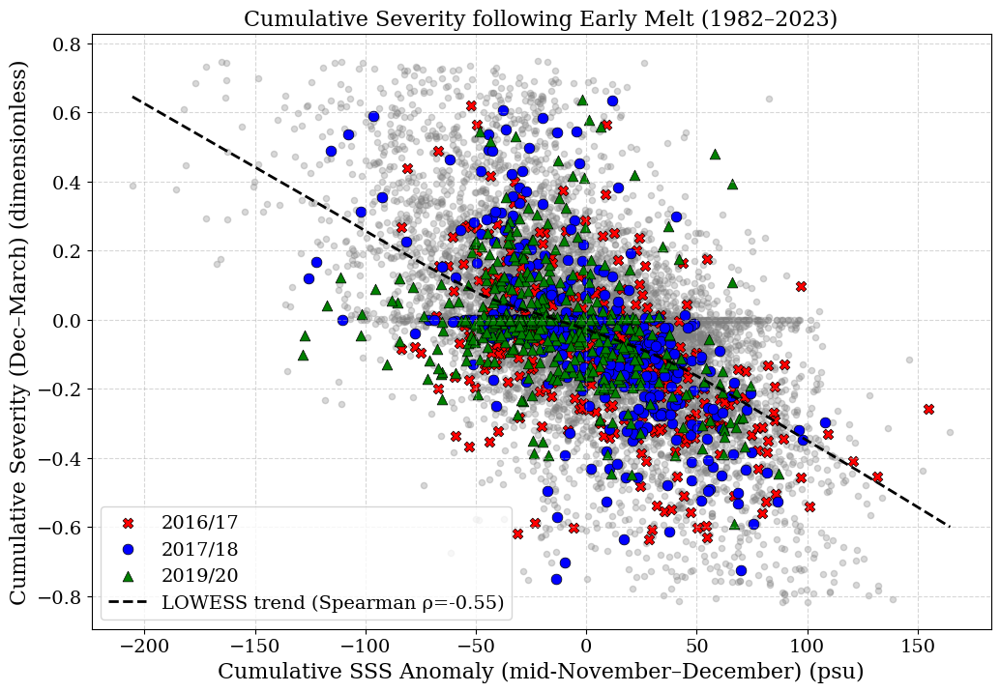

Spearman correlation: ρ = -0.5542, p-value = 0.0000e+00


In [131]:
import matplotlib.cm as cm
import matplotlib.colors as mcolors
import statsmodels.api as sm
from scipy.stats import spearmanr

# -----------------------------
# LOWESS smoothing
# -----------------------------
lowess = sm.nonparametric.lowess(y_clean, x_clean, frac=0.5)
x_lowess, y_lowess = lowess[:, 0], lowess[:, 1]

# -----------------------------
# Spearman correlation
# -----------------------------
rho, rho_p = spearmanr(x_clean, y_clean)

# -----------------------------
# Plot
# -----------------------------
fig, ax = plt.subplots(figsize=(12,8))

# Masks for special years
mask_2017 = years_clean == 2017
mask_2018 = years_clean == 2018
mask_2020 = years_clean == 2020
mask_2020 = years_clean == 2022
mask_2020 = years_clean == 2023

mask_normal = ~(mask_2017 | mask_2018 | mask_2020)

# Plot all other years (grey dots)
ax.scatter(x_clean[mask_normal], y_clean[mask_normal],
           alpha=0.3, s=20, color="grey")

# Highlight 2017 with X (red)
ax.scatter(x_clean[mask_2017], y_clean[mask_2017],
           color="red", s=60, marker='X',
           edgecolors='black', linewidths=0.5, label='2016/17')

# Highlight 2018 with circle (blue)
ax.scatter(x_clean[mask_2018], y_clean[mask_2018],
           color="blue", s=60, marker='o',
           edgecolors='black', linewidths=0.5, label='2017/18')

# Highlight 2020 with triangle (green)
ax.scatter(x_clean[mask_2020], y_clean[mask_2020],
           color="green", s=60, marker='^',
           edgecolors='black', linewidths=0.5, label='2019/20')

# LOWESS trend
ax.plot(x_lowess, y_lowess, color="black", lw=2, ls="--",
        label=f"LOWESS trend (Spearman ρ={rho:.2f})")

# Labels & title
ax.set_xlabel("Cumulative SSS Anomaly (mid-November–December) (psu)", fontsize=16)
ax.set_ylabel("Cumulative Severity (Dec–March) (dimensionless)", fontsize=16)
ax.set_title("Cumulative Severity following Early Melt (1982–2023)", fontsize=16)

# Tick size
ax.tick_params(axis='both', which='major', labelsize=14)

# Grid and legend
ax.grid(ls="--", alpha=0.5)
ax.legend(fontsize=14)

plt.show()

# -----------------------------
# Print Spearman result
# -----------------------------
print(f"Spearman correlation: ρ = {rho:.4f}, p-value = {rho_p:.4e}")
